![alt text](https://upload.wikimedia.org/wikipedia/commons/thumb/c/c9/Jane_Street_Capital_Logo.svg/1920px-Jane_Street_Capital_Logo.svg.png "Jane Street")

# Jane Street Market Prediction

Domínio: Financeiro

Problema: Identificar oportunidades lucrativas de trades
    
Solução: Vamos desenvolver um modelo de trading quantitativo que maximize os retornos usando dados reais da bolsa de valores fornecidos pela organização Jane Street.

Os dados se encontram em https://www.kaggle.com/c/jane-street-market-prediction

In [1]:
from IPython.core.display import HTML
HTML(open('jane_content.html', 'r').read())

<a id='introduction'></a>
<h2 style="color:DarkBlue" >Introdução</h2>

Primeiramente, temos que definir o que é trade.

De acordo com [Capital Research](https://www.capitalresearch.com.br/blog/investimentos/o-que-e-trade/), trade é o nome dado à operação de compra e venda de ativos (que pode ser uma ação ou um contrato que representa um índice, uma moeda, etc) no curto ou médio prazo. Quem realiza trade aproveita a oscilação de preços e a volatilidade do mercado para ganhar com a especulação.

Sabendo disso, podemos voltar a atenção ao dataset fornecido.

In [2]:
ls -lh --time-style=+"" jane_street_train.csv

-rw-r--r-- 1 root root 5.8G  jane_street_train.csv


In [3]:
import pandas as pd
import numpy as np
import IPython

In [4]:
%%time
df_train = pd.read_csv('jane_street_train.csv')

CPU times: user 1min 53s, sys: 34.7 s, total: 2min 28s
Wall time: 5min 56s


A biblioteca Pandas consome 16 GB de ram para abrir este dataset, mas se estabiliza como é mostrado adiante: 

In [5]:
df_train.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2390491 entries, 0 to 2390490
Columns: 138 entries, date to ts_id
dtypes: float64(135), int64(3)
memory usage: 2.5 GB


Para facilitar a análise dos dados, reduziremos os tipos das colunas. A perda de dados é mínima.

In [6]:
def reduce_mem_usage(df):
    start_mem = compute_df_total_mem(df)
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:  
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                else:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = compute_df_total_mem(df)
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df


def compute_df_total_mem(df):
    """Returns a dataframe's total memory usage in MB."""
    return df.memory_usage(deep=True).sum() / 1024 ** 2

In [7]:
%%time
df_train_reduced = reduce_mem_usage(df_train)

Memory usage of dataframe is 2516.84 MB
Memory usage after optimization is: 631.49 MB
Decreased by 74.9%
CPU times: user 55.5 s, sys: 55.4 s, total: 1min 50s
Wall time: 3min 48s


O dataset reduzido será salvo.

In [8]:
%%time
df_train_reduced.to_pickle('jane_street_train_reduced.pkl')

CPU times: user 40.3 ms, sys: 746 ms, total: 786 ms
Wall time: 1.62 s


In [9]:
ls -lh --time-style=+"" jane_street_train_reduced.pkl

-rw-r--r-- 1 root root 632M  jane_street_train_reduced.pkl


Escolhemos o formato pickle por sua simplicidade. Existem formatos que não são dependentes da versão do Python como h5, feather, jay, parquet, entre outros. 

In [10]:
IPython.Application.instance().kernel.do_shutdown(True) #automatically restarts kernel

{'status': 'ok', 'restart': True}

Agora podemos continuar normalmente.

<a id='libraries'></a>
<h2 style="color:DarkBlue" >Preparação do ambiente</h2>

Vamos baixar e importar as bibliotecas necessárias.

In [11]:
!pip install -U -q networkx
!pip install -U -q pyvis

In [12]:
import gc
import random
import numpy as np
import pandas as pd
import networkx as nx
from scipy import stats
import scipy.cluster.hierarchy as sch
from pyvis.network import Network
from itertools import cycle, chain
from collections import Counter
from IPython.display import IFrame
import IPython

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline

import seaborn as sns

import plotly.express as px
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

<a id='load'></a>
<h2 style="color:DarkBlue" >Carregação dos dados</h2>

In [13]:
%%time
df_train = pd.read_pickle('jane_street_train_reduced.pkl')
df_features = pd.read_csv('features.csv.xz')

CPU times: user 53 ms, sys: 2.01 s, total: 2.07 s
Wall time: 21 s


In [14]:
df_train.head()

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009918,0.014076,0.008774,0.001390,0.006271,1,-1.873047,-2.191406,...,NaN,1.167969,8.312500,1.782227,14.015625,2.652344,12.601562,2.300781,11.445312,0
1,0,16.671875,-0.002829,-0.003227,-0.007320,-0.011116,-0.009789,-1,-1.349609,-1.705078,...,NaN,-1.178711,1.777344,-0.915527,2.832031,-1.416992,2.296875,-1.304688,1.898438,1
2,0,0.000000,0.025131,0.027603,0.033417,0.034393,0.023972,-1,0.812988,-0.256104,...,NaN,6.117188,9.664062,5.542969,11.671875,7.281250,10.062500,6.636719,9.429688,2
3,0,0.000000,-0.004730,-0.003273,-0.000461,-0.000476,-0.003201,-1,1.174805,0.344727,...,NaN,2.837891,0.499268,3.033203,1.513672,4.398438,1.265625,3.855469,1.013672,3
4,0,0.138550,0.001252,0.002165,-0.001216,-0.006218,-0.002604,1,-3.171875,-3.093750,...,NaN,0.344971,4.101562,0.614258,6.625000,0.800293,5.234375,0.362549,3.925781,4


In [15]:
df_train.shape

(2390491, 138)

A informação sobre as colunas dos dados do treino se encontra abaixo:

|Atributo            |Descrição                                                        |
|:------------------:|:---------------------------------------------------------------:|
|date                |Dia do trade                                                     |
|weight              |Valor associado ao retorno do trade                              |
|resp_{1,2,3,4}      |Retorno do trade em diferentes horizontes temporais              |
|resp                |Assim como weight, está associado ao retorno do trade            |
|feature_{0...129}   |Dados reais do mercado de ações                                  |
|ts_id               |Ordenamento temporal                                             |

Agora vamos observar o dataset features.

In [16]:
df_features.head()

,feature,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8,...,tag_19,tag_20,tag_21,tag_22,tag_23,tag_24,tag_25,tag_26,tag_27,tag_28
0,feature_0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,feature_1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,feature_2,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,feature_3,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,feature_4,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0


In [17]:
df_features.shape

(130, 30)

As tags são metadados pertencentes aos atributos anonimizados.

<a id='helper_functions'></a>
<h2 style="color:DarkBlue" >Código de ajuda</h2>

In [18]:
matplotlib.style.use('seaborn')

In [19]:
n_colors1 = ['blue', 'red', 'green', 'lightseagreen', 'darkorange']
my_cmap = ListedColormap(n_colors1)
my_palette = sns.color_palette(n_colors1, 5)

In [20]:
graph_colors = ['#FFFFFF', '#FFFF00', '#CA7D29', '#555555', '#00FF00', '#EE82EE', '#40E0D0', '#FF6347', '#FFB68D']

As duas células abaixo são responsáveis pela geração aleatória de cores que serão usadas em alguns gráficos.

In [21]:
def ColorDistance(rgb1, rgb2):
    rgb1 = np.array(list(bytearray.fromhex(rgb1[1:])))
    rgb2 = np.array(list(bytearray.fromhex(rgb2[1:])))
    '''d = {} distance between two colors(3)'''
    rm = 0.5*(rgb1[0]+rgb2[0])
    d = sum((2+rm,4,3-rm)*(rgb1-rgb2)**2)**0.5
    return d

In [22]:
number_of_colors, background, threshold = 4 * 130, '#E3E5E7', 600
k_colors = cycle(tuple(filter(lambda color: ColorDistance(color, background) > threshold,
                              ["#" + ''.join([random.choice('0123456789ABCD') for j in range(6)])
                                       for i in range(number_of_colors)])))

Em certos gráficos trabalheremos com uma amostra de 10% do dataset, pois o tempo para renderizar todos os dados é muito alto.

In [23]:
sample_size = round(df_train.shape[0] * 0.1)

<a id='eda1'></a>
<h2 style="color:DarkBlue" >Análise exploratória (parte 1)</h2> 

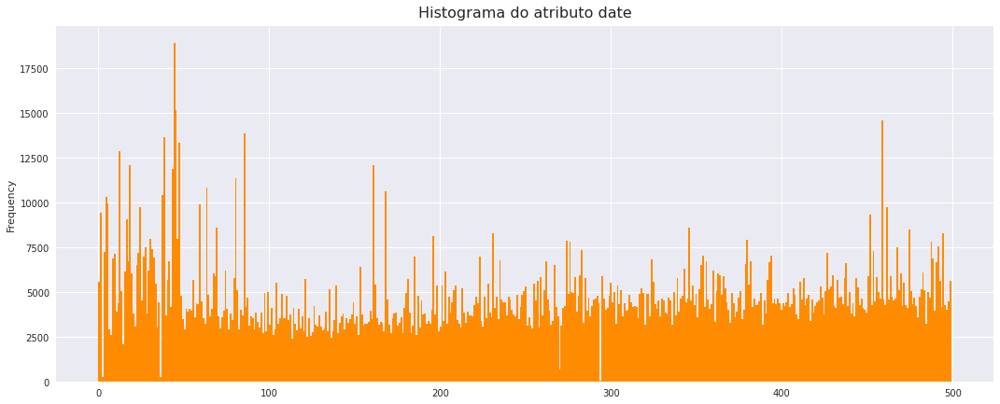

In [24]:
df_train['date'].plot(kind='hist', bins=500, figsize=(18, 7), xlabel='date', ylabel='count', color='darkorange').set_title('Histograma do atributo date', fontdict=dict(fontsize=16), pad=10);

In [25]:
trades = df_train.groupby('date')['ts_id'].count().sort_values(ascending=False).reset_index().rename(columns={'ts_id': 'trades'})

In [26]:
fig = px.box(trades,
             x='trades',
             hover_data={'date': True},
             color_discrete_sequence=['darkorange'],
             title='Dias considerados como outliers')
fig.show()

Pela análise do atributo date, nota-se que há operações de trades sendo realizadas mais em certos dias, sendo isto refletido no boxplot, que revela um considerável número de outliers.

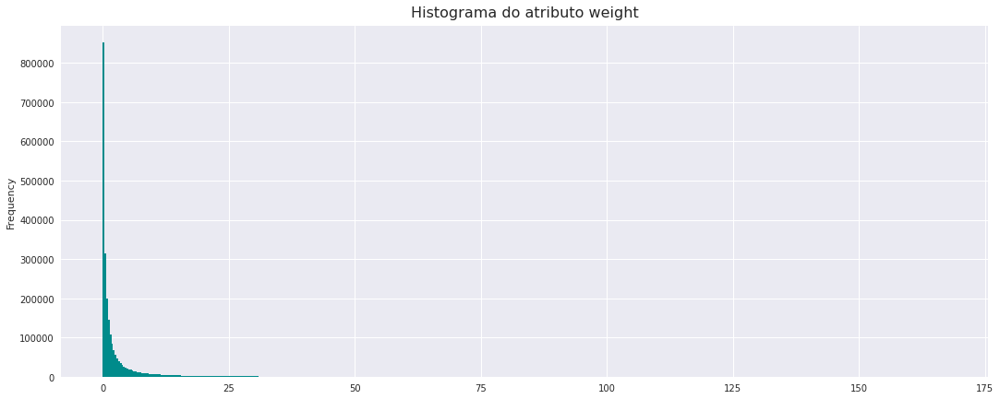

In [27]:
df_train['weight'].plot(kind='hist', bins=500, figsize=(18, 7), xlabel='date', ylabel='count', color='darkcyan').set_title('Histograma do atributo weight', fontdict=dict(fontsize=16), pad=10);

In [28]:
df_train['weight'].astype('float32').describe()

count    2.390491e+06
mean     3.031533e+00
std      7.672781e+00
min      0.000000e+00
25%      1.617432e-01
50%      7.084961e-01
75%      2.472656e+00
max      1.672500e+02
Name: weight, dtype: float64

Os dados do atributo weight estão concentrados numa faixa muito reduzida, sendo o valor $0$ o mais frequente.

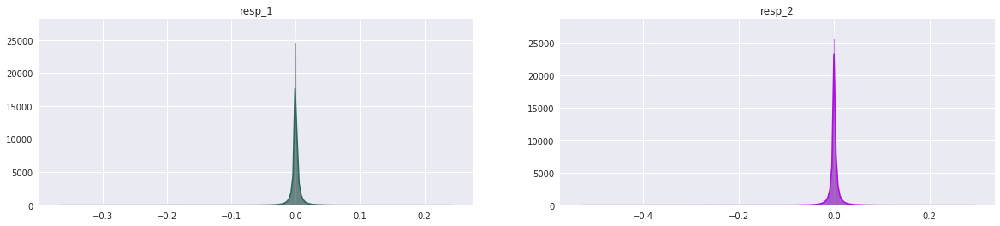

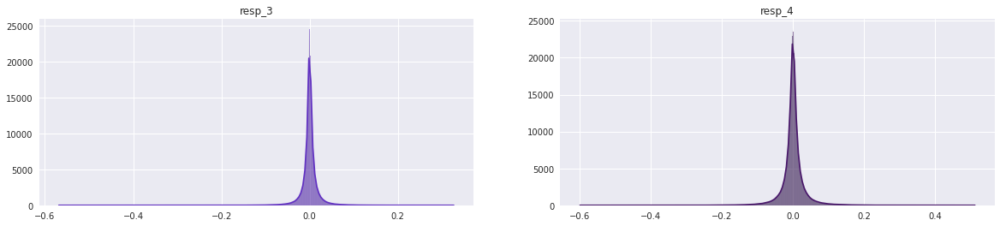

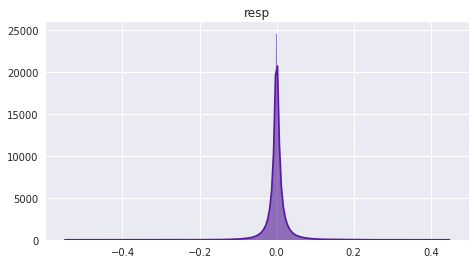

CPU times: user 3min 59s, sys: 3.67 s, total: 4min 3s
Wall time: 3min 58s


In [29]:
%%time
rows, columns = 2, 2
col_names = [col_name for col_name in df_train.filter(regex=('resp.*')).columns]

for i in range(rows):
    fig, axes = plt.subplots(1, columns, figsize=(20, 4))
    for j in range(columns):
        sns.histplot(ax=axes[j], x=df_train[col_names[j + columns * i]], kde=True, color=next(k_colors)).set(title=col_names[j + columns * i], xlabel=None, ylabel=None)
    plt.show()

fig, ax = plt.subplots(figsize=(7.58, 4))
sns.histplot(x=df_train['resp'], kde=True, color=next(k_colors)).set(title='resp', xlabel=None, ylabel=None)
plt.show()

del fig, axes
throw = gc.collect()

Pelos gráficos acima, cada atributo "resp" tem o formato de distribuição normal. Vamos averiguar se isso é verdade.

Hipótese:

* $H_{0}$: Os dados apresentam uma distribuição normal.

* $H_{1}$: Os dados não apresentam uma distribuição normal.

O intervalo de confiança usado é de 95%.

In [30]:
def normal_distribuition(feature, alpha=0.05):
    k2, p = stats.normaltest(feature)
    
    if p < alpha:  # null hypothesis: feature comes from a normal distribution
        print("A hipótese nula pode ser rejeitada")
    else:
        print("A hipótese nula não pode ser rejeitada")

In [31]:
normal_distribuition(df_train['resp_1'])

A hipótese nula pode ser rejeitada


In [32]:
normal_distribuition(df_train['resp_2'])

A hipótese nula pode ser rejeitada


In [33]:
normal_distribuition(df_train['resp_3'])

A hipótese nula pode ser rejeitada


In [34]:
normal_distribuition(df_train['resp_4'])

A hipótese nula pode ser rejeitada


In [35]:
normal_distribuition(df_train['resp'])

A hipótese nula pode ser rejeitada


Comprovamos que nenhum dos atributos "resp" poussui distribuição normal.

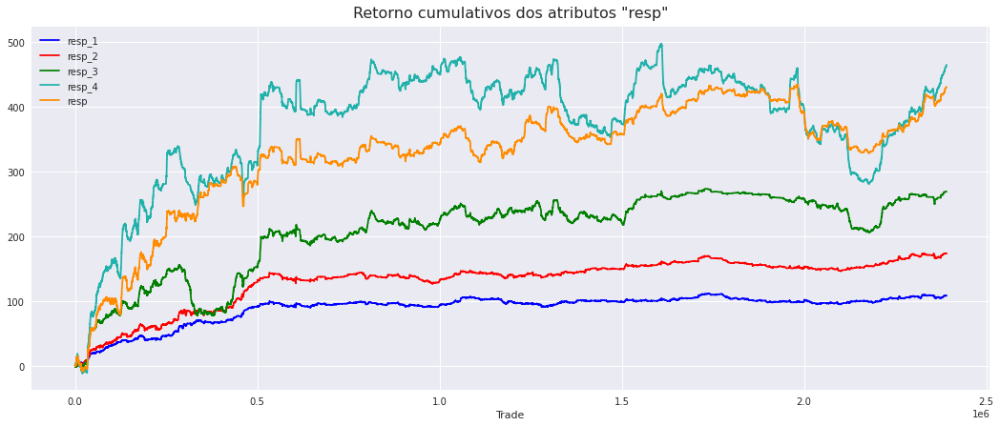

In [36]:
df_train[['resp_1', 'resp_2', 'resp_3', 'resp_4', 'resp']].cumsum().plot(figsize=(18, 7), xlabel='Trade', colormap=my_cmap).set_title('Retorno cumulativos dos atributos "resp"', fontdict=dict(fontsize=16), pad=10);

Vemos que resp_4 retorna o maior lucro. Infelizmente não sabemos com qual frequência as operações de trade estão sendo realizadas em cada dia.

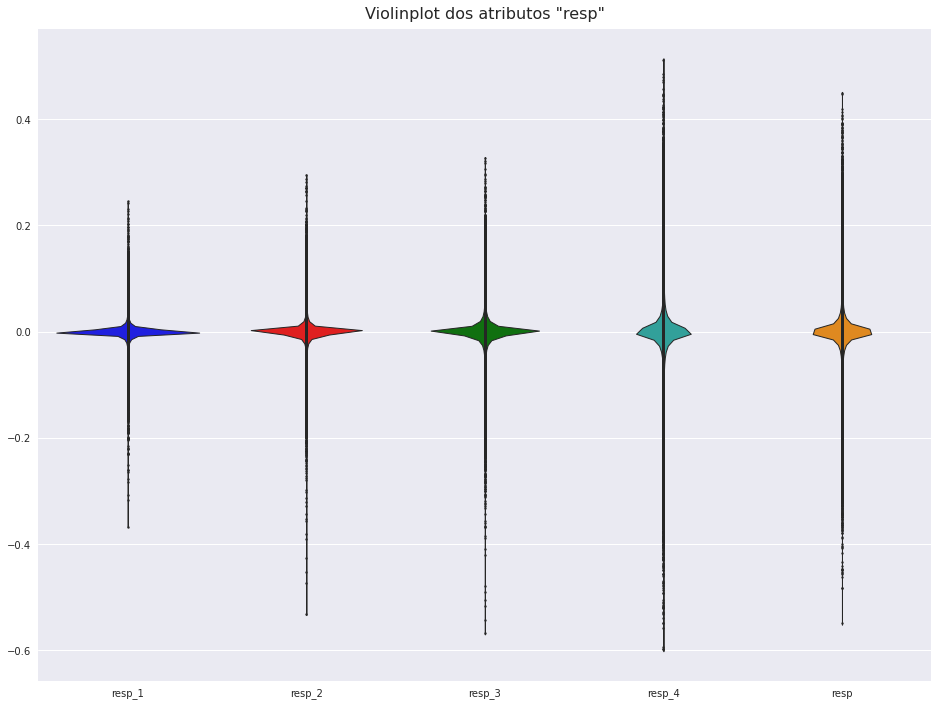

In [37]:
fig, ax = plt.subplots(figsize=(16, 12))
sns.violinplot(data=df_train[['resp_1', 'resp_2', 'resp_3', 'resp_4', 'resp']],
               inner="points", 
               linewidth=1, 
               palette=my_palette, 
               ax=ax).set_title('Violinplot dos atributos "resp"', fontdict=dict(fontsize=16), pad=10);

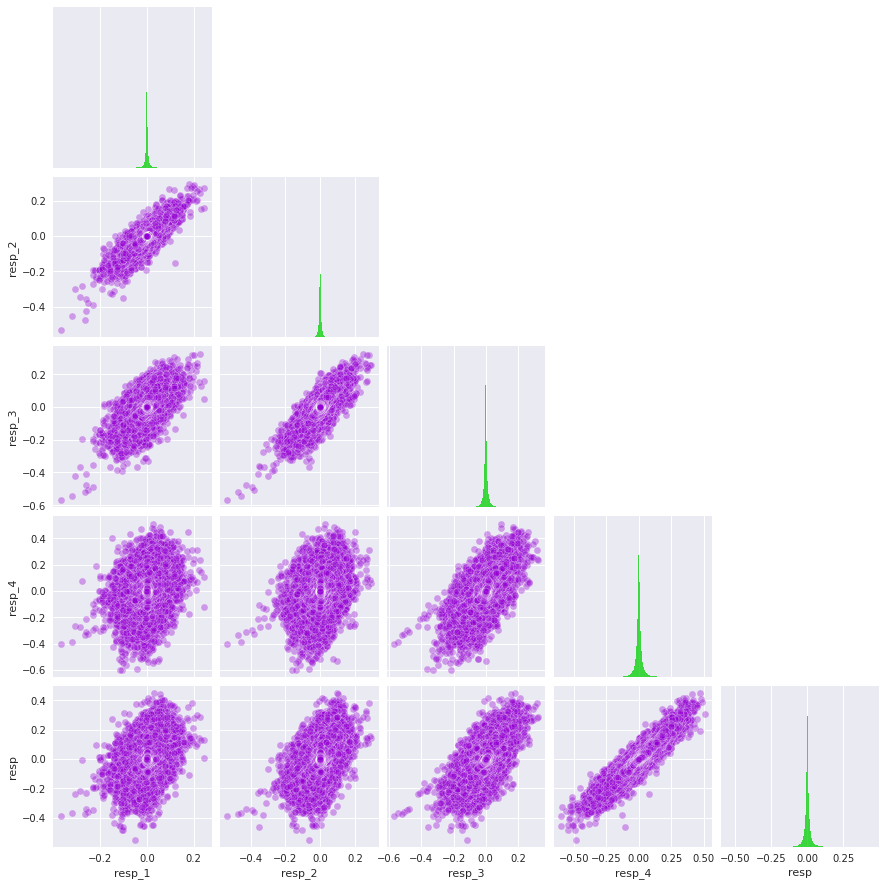

In [38]:
sns.pairplot(df_train.filter(regex=('resp.*')),
             corner=True,
             plot_kws=dict(color='#9400D3',
                           alpha=0.35),
             diag_kws=dict(color='#00D000'));

Pela distribuição dos dados, nota-se similaridade entre os três primeiros atributos "resp" e os dois últimos.

In [39]:
fig = px.bar(df_train.loc[:, df_train.isnull().any()].isnull().sum().sort_values(ascending=False).to_frame().reset_index().rename(columns={'index': 'atributos', 0: 'nulos'}),
             x='atributos',
             y='nulos',
             color='nulos',
             color_continuous_scale=px.colors.qualitative.G10_r,
             title='Quantidade de valores nulos por atributo')

fig.update_traces(hovertemplate='<b>%{x}</b><br><br>nulos=%{y}<extra></extra>')
fig.update_coloraxes(showscale=False)
fig.show()

Percebe-se que os valores nulos apresentam um padrão.

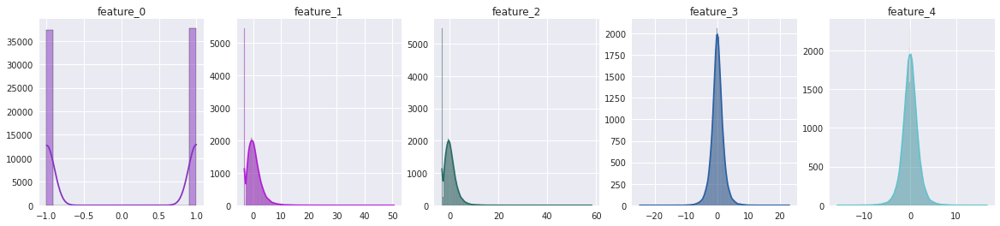

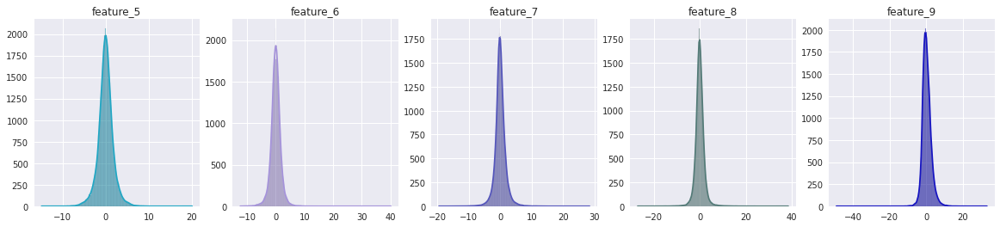

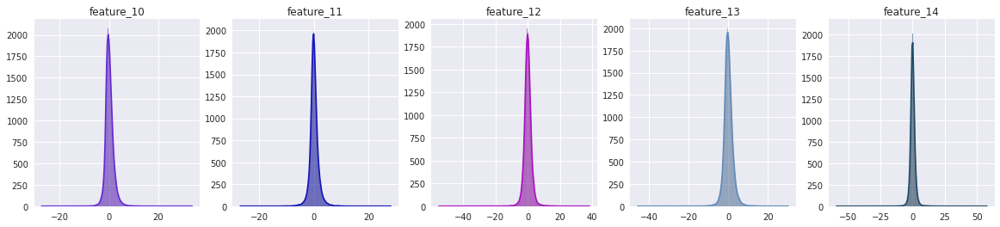

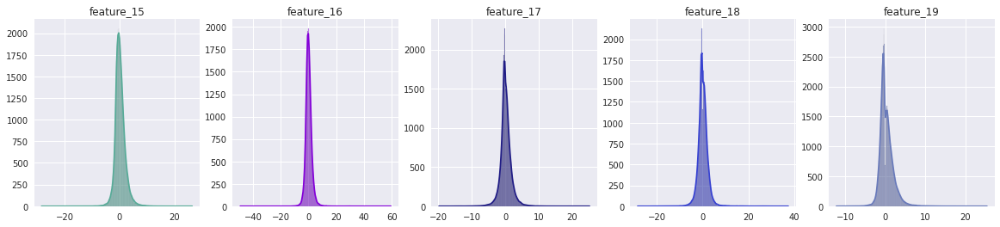

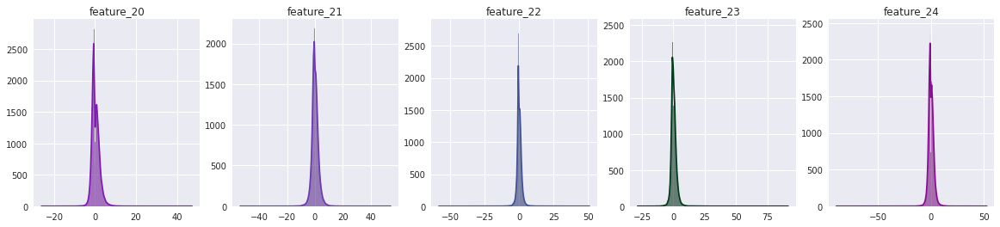

...

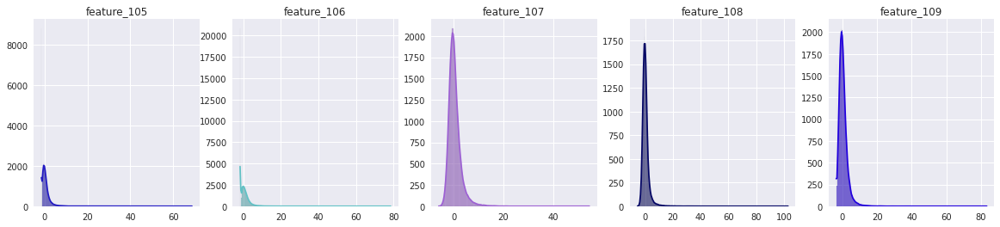

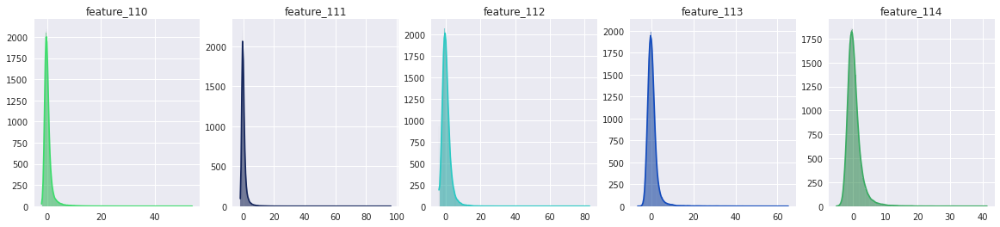

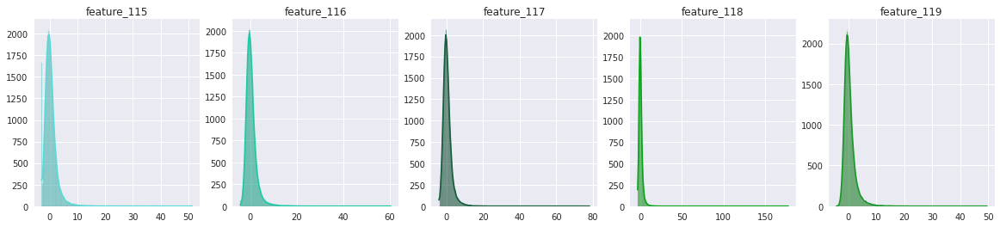

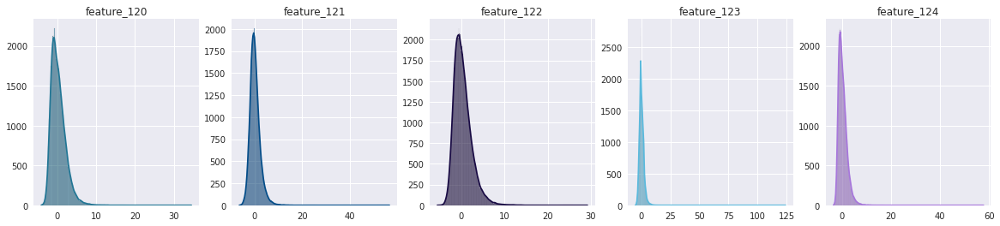

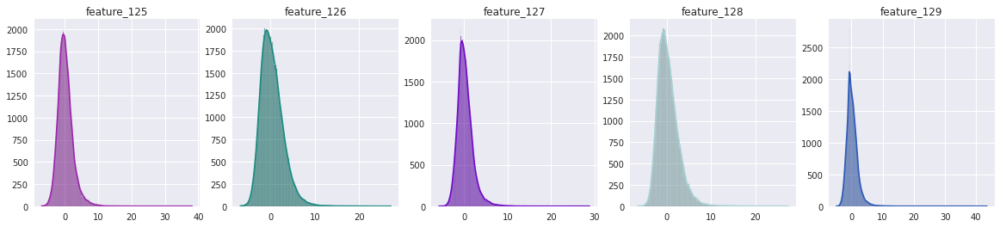

In [40]:
rows, columns = 26, 5
col_names = [col_name for col_name in df_train.filter(regex=('feat.*')).columns]

for i in range(rows):
    fig, axes = plt.subplots(1, columns, figsize=(20, 4))
    for j in range(columns):
        sns.histplot(ax=axes[j], x=df_train[col_names[j + columns * i]].sample(sample_size), kde=True, color=next(k_colors)).set(title=col_names[j + columns * i], xlabel=None, ylabel=None)
    plt.show()

del fig, axes
throw = gc.collect()

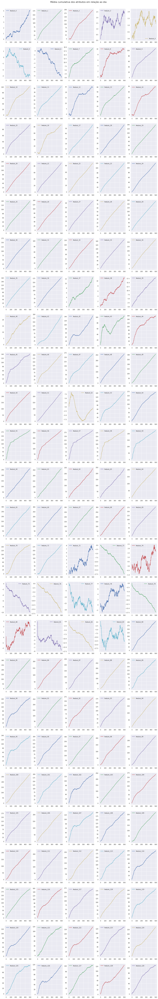

In [41]:
df_train.groupby('date')[col_names].mean().cumsum().plot(layout=(26, 5), subplots=True, sharex=False, figsize=(19.5, 130), xlabel='')
fig = plt.gcf()
fig.suptitle('Média cumulativa dos atributos em relação ao dia', fontsize=16, y=.886);

Tanto os histogramas quanto as médias cumulativas mostram similaridades entre determinados grupos de atributos.

Os atributos 17 à 36 demostram um aumento linear de seus dados.

In [42]:
def heatmap(data, method, annot=False):
    sns.set(style="white")
    corr = data.corr(method=method)

    mask = np.zeros_like(corr, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(32.3, 32.3))
    ax.set_title('Correlação ' + method, y=1.02, fontsize=16)
    sns_plot = sns.heatmap(corr, mask=mask, annot=annot, vmax=1, center=0, square=True, fmt=".1f", linewidths=.5, cbar_kws={"shrink": .8}, cmap=sns.color_palette('BrBG', as_cmap=True))
    plt.show()

In [43]:
data = df_train.filter(regex=('feat.*'))

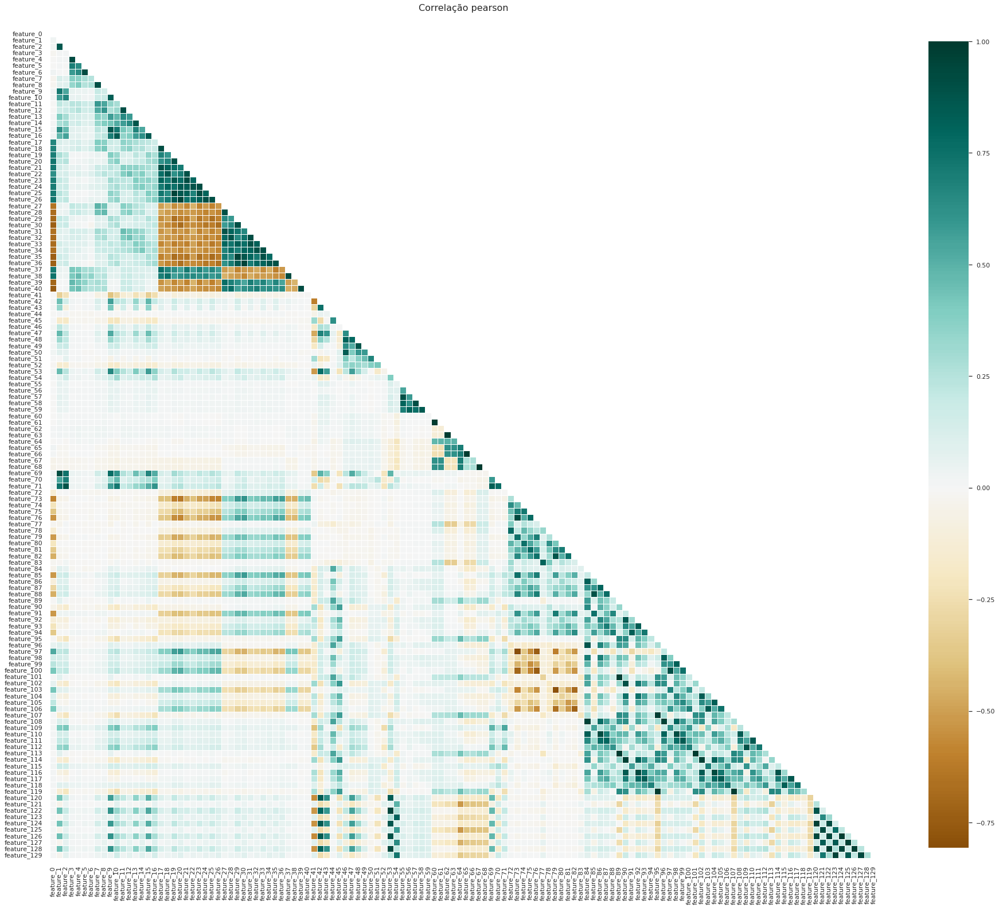

In [44]:
heatmap(data=data.sample(sample_size), method='pearson')

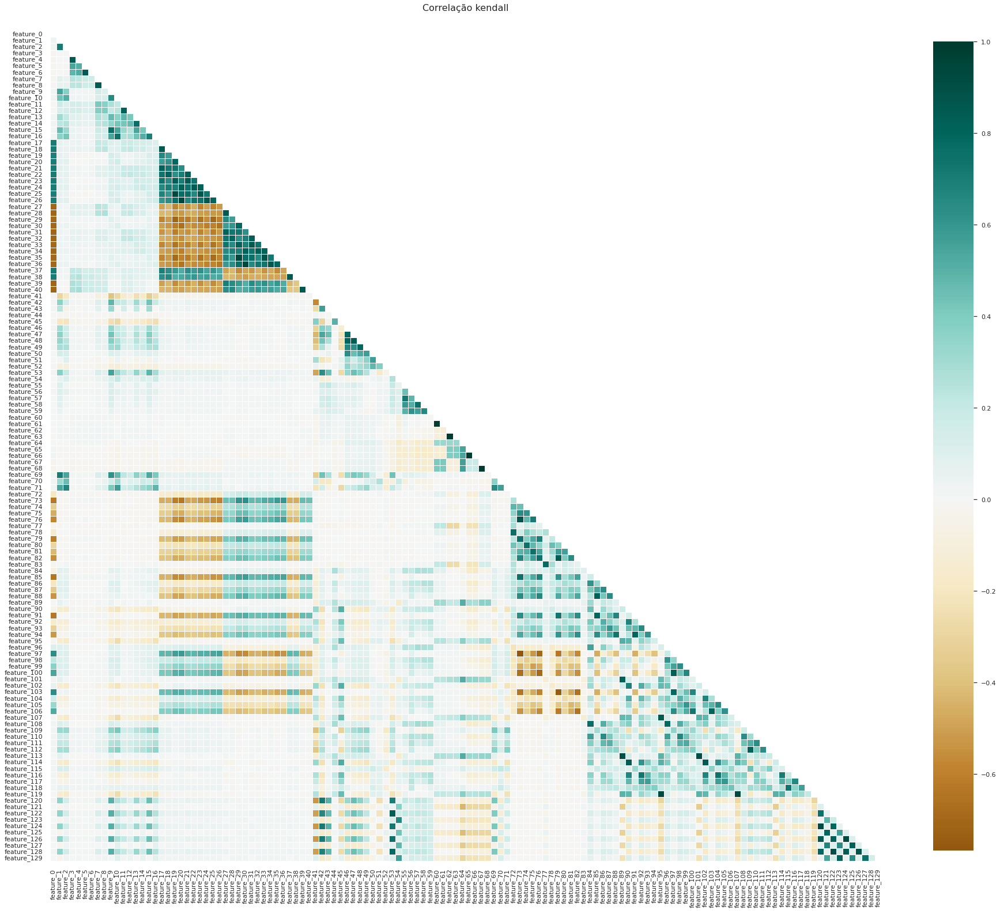

In [45]:
heatmap(data=data.sample(sample_size), method='kendall')

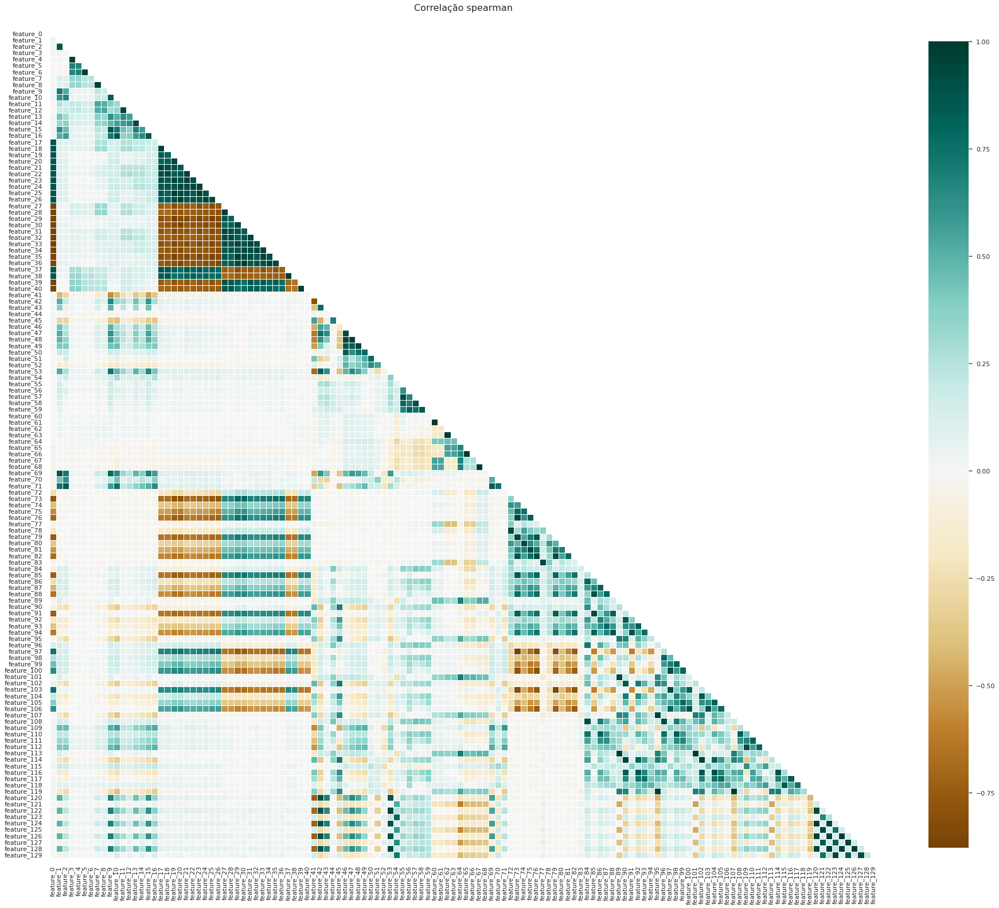

In [46]:
heatmap(data=data.sample(sample_size), method='spearman')

As correlações também demonstram similaridades entre certos atributos.

In [47]:
corr = data.corr()

In [48]:
#Clusters
pdist = sch.distance.pdist(corr)
linkage = sch.linkage(pdist, method='complete')
cluster = sch.fcluster(linkage, 0.5 * pdist.max(), 'distance')

In [49]:
#Correlation distance
dist = ((1-corr)/2.)**.5

In [50]:
fig = ff.create_dendrogram(dist,
                           orientation='left',
                           labels=data.columns.values,
                           linkagefun=lambda x: sch.linkage(x, 'single'))
fig.update_layout(width=800, height=1800, font_size=11, title_text='Cluster Hieráquico dos atributos anonimizados')
fig.show()

Agora vamos nos atentar ao dataframe df_features.

In [51]:
tags_cols = df_features.iloc[:,1:].columns
tags = df_features.iloc[:,1:].apply(lambda x: x > 0).apply(lambda x: list(tags_cols[x.values]), axis=1)
tags_count = dict(Counter(list(map(str, chain.from_iterable(tags.to_list())))).most_common())

In [52]:
fig = px.bar(x=tags_count.keys(),
             y=tags_count.values(),
             color_discrete_sequence=['darkcyan'],
             title='Frequência das tags')

fig.update_traces(hovertemplate='<b>%{x}</b><br><br>contagem=%{y}<extra></extra>')
fig.update_layout(xaxis=dict(title='tags'), yaxis=dict(title='contagem'))
fig.show()

In [53]:
feature_tags_count = pd.concat([df_features.iloc[:,1:].apply(lambda x: x[x == True].count(), axis=1), tags], ignore_index=True, axis=1).sort_values(by=[0], ascending=False).reset_index().rename(columns={'index': 'atributos', 0: 'contagem', 1: 'tags'})
feature_tags_count['atributos'] = feature_tags_count['atributos'].map(lambda x: 'feature_' + str(x))
feature_tags_count['tags'] = feature_tags_count['tags'].map(lambda x: ', '.join(x))

In [54]:
fig = px.bar(feature_tags_count,
             x='atributos',
             y='contagem',
             hover_data={'tags': True},
             color_discrete_sequence=['darkcyan'],
             title='Quantidade de tags por atributo')

fig.update_traces(hovertemplate='<b>%{x}</b><br><br>contagem=%{y}<br>tags=%{customdata[0]}<extra></extra>')
fig.update_layout(xaxis=dict(title='tags'), yaxis=dict(title='contagem'))
fig.show()

As tags 23 e 6 são bem presentes nos atributos que possuem de 4 à 3 tags.

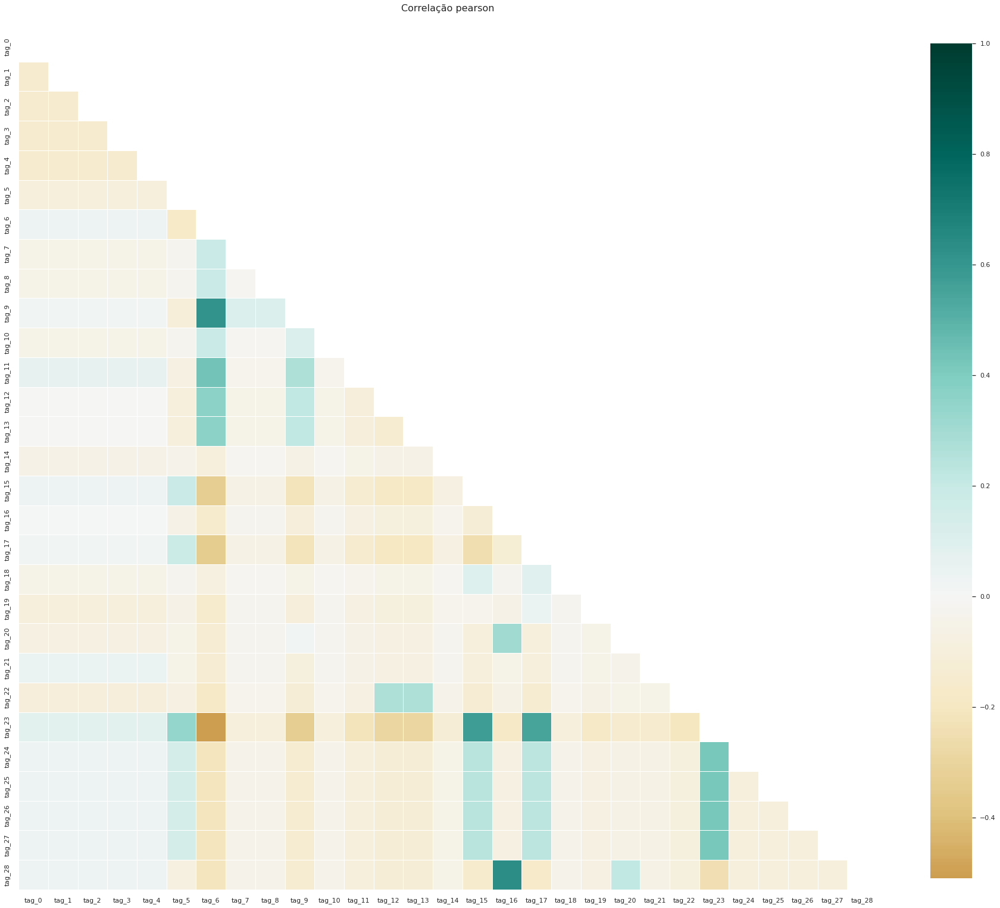

In [55]:
heatmap(data=df_features.iloc[:,1:], method='pearson')

Certas tags possuem um bom nível de correlação entre si pelo fato de estarem presentes em determinados grupos de atributos. Se invertermos o dataframe df_features, conseguimos ver a similaridade dos atributos baseado em suas tags.

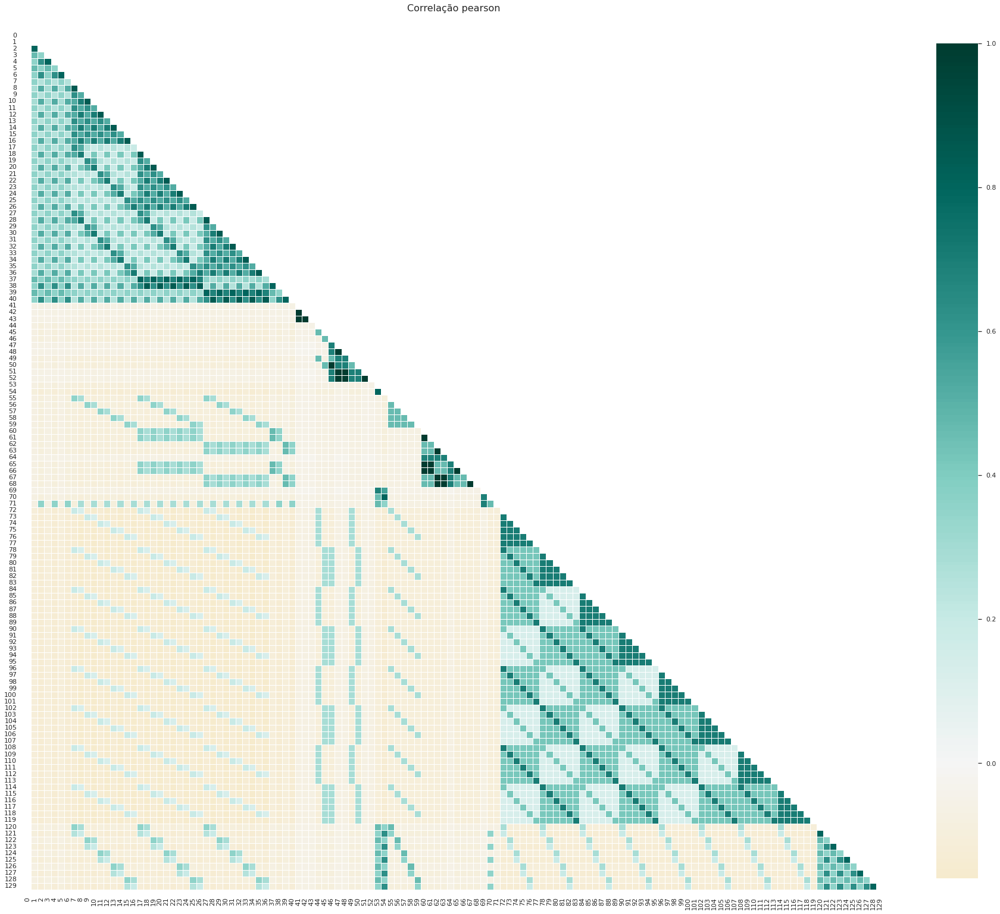

In [56]:
heatmap(data=df_features.iloc[:,1:].transpose(), method='pearson')

As correlações apresentam similaridades com as que havíamos no dataframe df_train.

Exibimos abaixo as correlações do dataframe df_train novamente para facilitar a comparação.

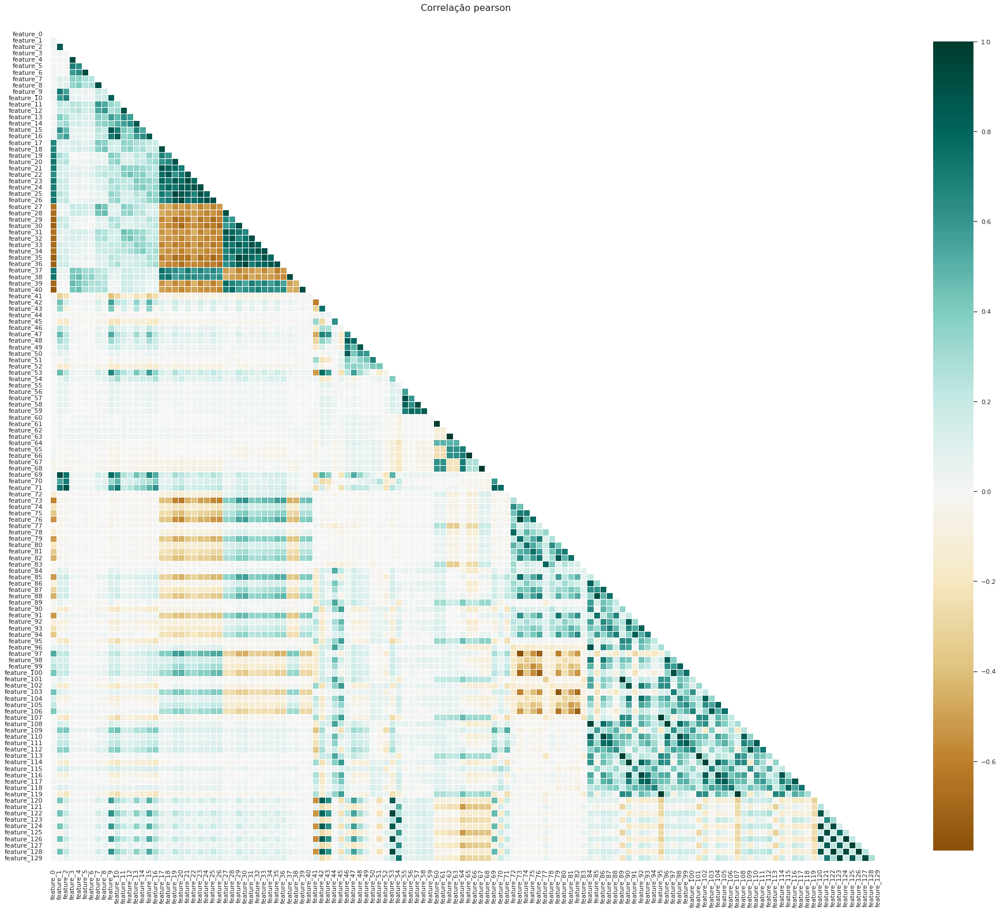

In [57]:
heatmap(data=data, method='pearson')

Para visualizar melhor as relações entre os atributos, vamos exibir um grafo interativo onde as cores representam os grupos gerados pelo cluster hieráquico e os atributos são ligados de acordo com a distância da matriz de correlação. 

In [58]:
G = nx.from_pandas_adjacency(dist)
T = nx.minimum_spanning_tree(G)

keys = dist.columns.values.tolist()
values = [{'color': graph_colors[cluster[i]], 'x': value[0] * 10, 'y': value[1] * 1000, 'title': ', '.join(tags[i])} for i, value in enumerate(nx.kamada_kawai_layout(T).values())]
attrs = dict(zip(keys, values))

nx.set_node_attributes(T, attrs)

In [59]:
nt = Network('800px', '800px')
nt.from_nx(T)
nt.show('nx.html')
IFrame(src='./nx.html', width=830, height=830)

Obs: Pode-se dar zoom com o mouse para melhor ver as relações.

<a id='eda2'></a>
<h2 style="color:DarkBlue" >Análise exploratória (parte 2)</h2> 

Uma tradução livre do conteúdo do endereço https://www.kaggle.com/c/jane-street-market-prediction/overview/evaluation

Esta competição é avaliada com base numa pontuação de utilidade. Cada linha do conjunto de teste representa uma oportunidade de trading para a qual você estará prevendo um valor de action, 1 para realizar o trade e 0 para o passar. Cada trade j tem um weight e resp associados, o que representa um retorno.

Para cada data i, nós definimos:

$$p_{i} = \sum \limits _{j} (weight_{ij} * resp_{ij} * action_{ij}),$$

$$t = \frac{\sum p_{i}}{\sqrt{\sum p_{i} ^ 2}} * \sqrt{\frac{250}{|i|}},$$

onde |𝑖| é o número de datas únicas no conjunto de teste. A utilidade é então definida como:

$$u = min(max(t, 0), 6) \sum p_{i}.$$

&nbsp;

Baseado neste informe, vamos definir a ação a ser tomada como df_train['resp'] > 0

In [60]:
df_train['action'] = (df_train['resp'] > 0).astype('int8')

In [61]:
col_names = [col_name for col_name in df_train.filter(regex=('feat.*')).columns]
columns_corr = df_train[col_names].apply(lambda x: x.corr(df_train['action'])).sort_values(ascending=False)

In [62]:
fig = px.bar(columns_corr,
             color_discrete_sequence=['darkorange'],
             title='Correlação dos atributos com a ação')

fig.update_traces(hovertemplate='<b>%{x}</b><br><br>valor=%{y}<extra></extra>')
fig.update_layout(showlegend=False, xaxis=dict(title='atributos'), yaxis=dict(title='correlação pearson'))
fig.show()

Nota-se que os atributos possuem uma correlação muito baixa com a ação.

In [63]:
def utility_score_bincount(date, weight, resp, action):
    count_i = len(np.unique(date))
    Pi = np.bincount(date, weight * resp * action)
    t = np.sum(Pi) / np.sqrt(np.sum(Pi ** 2)) * np.sqrt(250 / count_i)
    u = min(max(t, 0), 6) * np.sum(Pi)
    return u

In [64]:
utility_score_bincount(df_train['date'], df_train['weight'], df_train['resp'], df_train['action'])

224162.21089088917

A pontuação máxima que podemos obter nos dados para o treino é de 224162.21

In [65]:
IPython.Application.instance().kernel.do_shutdown(True) #automatically restarts kernel

{'status': 'ok', 'restart': True}

<a id='train'></a>
<h2 style="color:DarkBlue" >Treino</h2> 

Vamos utilizar os 130 atributos anonimizados para prever a variável action. Os valores nulos serão preenchindos pelo número -999, todos os dados serão normalizados com StandardScaler e os dados para teste serão compostos dos últimos 3 meses.

O modelo usado será XGBoost, por conter suporte nativo à utilização de GPU.

In [66]:
!pip install -U -q xgboost

In [67]:
import gc
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from xgboost import XGBClassifier

from IPython.core.display import HTML

import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [68]:
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [69]:
df_train = pd.read_csv('jane_street_train_fp32.csv')

In [70]:
features = list(filter(lambda x: x.startswith('feat'), df_train.columns.tolist()))

df_train[features] = df_train[features].fillna(-999)
df_train['action'] = (df_train['resp'] > 0).astype('int8')

In [71]:
date_split = 500 - 90

n_splits = 5
group_gap = 0

X_train, X_test = df_train[df_train['date'] < date_split][features], df_train[df_train['date'] >= date_split][features]
y_train, y_test = df_train[df_train['date'] < date_split]['action'], df_train[df_train['date'] >= date_split]['action']

In [72]:
def utility(estimator, X, idx):
    date = df_train.loc[idx, 'date'].values
    weight = df_train.loc[idx, 'weight'].values
    resp = df_train.loc[idx, 'resp'].values
    action = estimator.predict(X)

    p_i = np.bincount(date, weight * resp * action)
    t = p_i.sum() / np.sqrt((p_i ** 2).sum()) * np.sqrt(250 / np.unique(date).size)
    u = np.clip(t, 0, 6) * p_i.sum()
    return u

TimeSeriesSplit cross validation com 5 folds sendo os dados agrupados por dia e com espaçamento de 1 mês entre o treino e o teste.

In [73]:
%%time
gkf = TimeSeriesSplit(n_splits=n_splits, gap=group_gap)
splits = list(gkf.split(y_train.values, groups=df_train[df_train['date'] < date_split]['date'].values))
accuracy_scores, utility_scores= [], []

for fold, (ii_train, ii_test) in enumerate(splits):
    scaler = StandardScaler()
    xx_train, xx_test = X_train.loc[ii_train], X_train.loc[ii_test]
    yy_train, yy_test = y_train.loc[ii_train], y_train.loc[ii_test]
    
    model = Pipeline(steps=[('scaler', StandardScaler()),
                            ('estimator',  XGBClassifier(n_estimators=52,
                                                         max_depth=4,
                                                         learning_rate=0.015,
                                                         subsample=0.9,
                                                         colsample_bytree=0.8,
                                                         random_state=200,
                                                         tree_method='gpu_hist'))])

    model.fit(xx_train, yy_train)
    predictions = model.predict(xx_test)
    
    score = accuracy_score(y_true=yy_test, y_pred=predictions)
    accuracy_scores.append(score)
    
    score = utility(model, xx_test, ii_test)
    utility_scores.append(score)
    
    del xx_train, xx_test, yy_train, yy_test, model, predictions, score
    gc.collect()

CPU times: user 4min 18s, sys: 5.47 s, total: 4min 23s
Wall time: 4min 22s


In [74]:
accuracy_scores

[0.5134397947751296,
 0.5158147358697247,
 0.5122133140258841,
 0.5090300815469262,
 0.5097385068143021]

In [75]:
utility_scores

[1202.5967295647195,
 1287.6823608758534,
 84.39685974228864,
 172.45395327347762,
 -0.0]

Já que observamos a pontuação do modelo em cada fold, ele será treinado com todos os dados separados para treino e testado nos dados dos últimos 3 meses.

In [76]:
%%time
model = Pipeline(steps=[('scaler', StandardScaler()),
                        ('estimator',  XGBClassifier(n_estimators=52,
                                                     max_depth=4,
                                                     learning_rate=0.015,
                                                     subsample=0.9,
                                                     colsample_bytree=0.8,
                                                     random_state=200,
                                                     tree_method='gpu_hist'))])

model.fit(X_train, y_train)

CPU times: user 1min 22s, sys: 1.8 s, total: 1min 24s
Wall time: 1min 31s


In [77]:
%%time
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

print('Acurácia no treino: ', accuracy_score(y_train, y_pred_train))
print('Acurácia no teste:  ', accuracy_score(y_test, y_pred_test))

Acurácia no treino:  0.5200655162315996
Acurácia no teste:   0.5102946267903931
CPU times: user 10.5 s, sys: 2.47 s, total: 13 s
Wall time: 13.8 s


In [78]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.52      0.38      0.44    234918
           1       0.51      0.65      0.57    232996

    accuracy                           0.51    467914
   macro avg       0.51      0.51      0.50    467914
weighted avg       0.51      0.51      0.50    467914



In [79]:
def plot_confusion(y_test, y_pred):
    cm = confusion_matrix(y_true=y_test, y_pred=y_pred)
    f, ax = plt.subplots(figsize=(6, 6))
    sns.heatmap(cm, annot=True, ax = ax, fmt = 'g', cmap=plt.cm.Greens);

    ax.set_title('Matriz de Confusão', fontsize=14)
    ax.set_xlabel('Previsto', fontsize=14)
    ax.xaxis.set_label_position('bottom') 
    ax.xaxis.set_ticklabels(['Action 0', 'Action 1'], fontsize = 14)
    ax.set_ylabel('Verdadeiro', fontsize=14)
    ax.yaxis.set_ticklabels(['Action 0', 'Action 1'], fontsize = 14)
    plt.rcParams.update({'font.size': 14})
    plt.show()

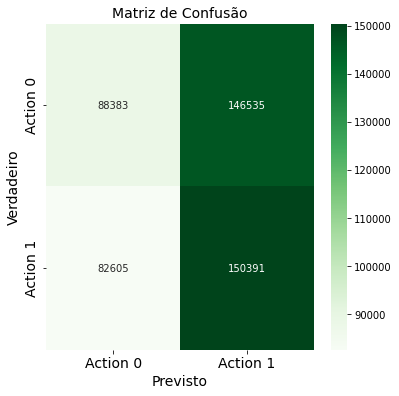

In [80]:
plot_confusion(y_test, y_pred_test)

In [81]:
utility(model, X_test, X_test.index.tolist())

1156.1514997551785

Agora vamos verificar a pontuação máxima que pode ser obtidada neste período. 

In [82]:
class OverfitEstimator(BaseEstimator, RegressorMixin):
    def __init__(self, **model_hyper_parameters):
        super().__init__()
        self.params_ = None

    def fit(self, X, Y=None):
        """
        Fit global model on X features to minimize 
        a given function on Y.

        @param X
        @param Y
        """
        self.params_ = Y
        return self

    def predict(self, X):
        """
        @param X: features vector the model will be evaluated on
        """
        return self.params_

In [83]:
model_2 = OverfitEstimator()
model_2.fit(X_test, y_test)

OverfitEstimator()

In [84]:
utility(model_2, X_test, X_test.index.tolist())

42839.93861051546

Isso prova o quão difícil é prever o mercado financeiro.

In [85]:
matplotlib.style.use('fivethirtyeight')

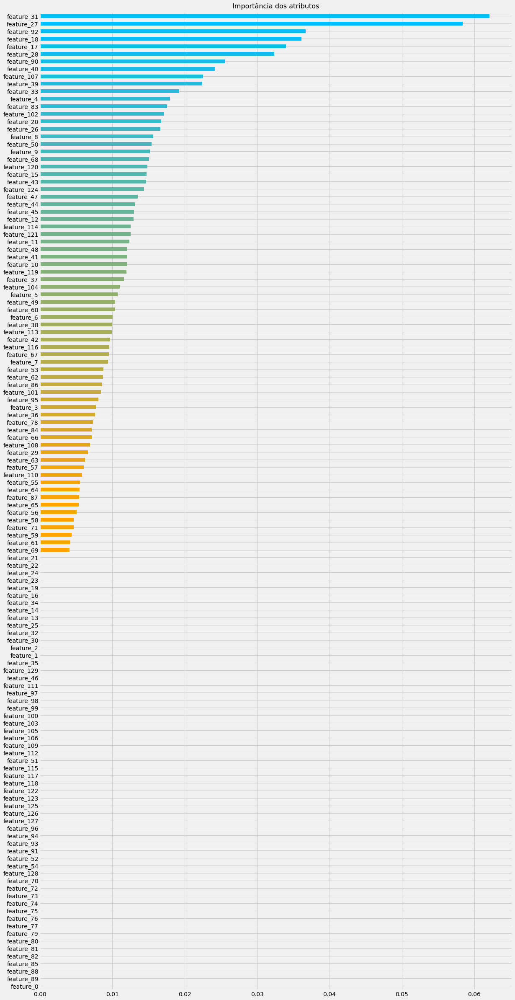

In [86]:
feature_scores = pd.Series(model.named_steps.estimator.feature_importances_, index=X_train.columns.values).sort_values(ascending=True)
feature_scores.plot(kind='barh', figsize=(18, 40), color=sns.color_palette('blend:orange,orange,deepskyblue', len(feature_scores))).set_title('Importância dos atributos', fontdict=dict(fontsize=16), pad=10);

O nosso modelo descartou a maior parte dos atributos. A razão disso é a forte correlação que eles possuem entre si, como vimos na análise exploratória.

<a id='conclusion'></a>
<h2 style="color:DarkBlue" >Conclusão</h2>

Criamos um modelo de trading quantitativo e vimos as dificuldades de se prever o mercado de ações. Pode-se utilizar arquiteturas de redes neurais como LSTM e Denoising Autoencoder para se obter uma melhor pontuação.

<a id='my_notebooks'></a>
<h2 style="color:Darkblue" >Meus notebooks</h2> 

In [87]:
HTML(open('jane_notebooks.html', 'r').read())

<a id='contact'></a>
<h2 style="color:Darkblue" >Contato</h2>

- **Email**: [rc3bastos@gmail.com](mailto:rc3bastos@gmail.com)
- **LinkedIn**: [linkedin.com/in/rc3bastos/](https://www.linkedin.com/in/rc3bastos/)